# Predict all images in the real_integral folder

Todo: Download the `real_integral` folder that has been uploaded by the tutors and save it into the same directory as this file. Then run the code in this file and the predictions will be saved to `real_integral_pred`.

In [1]:
from pathlib import Path
from utils import calculate_psnr_tensor, calculate_ssim_tensor
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import os
import cv2
import json
from glob import glob
from tqdm import tqdm

import numpy as np
import torch.nn.functional as F

from swin2sr import Swin2SR as Swin
from dataset import PositionDataset

def load_model(path: str):
    model = Swin(img_size=512,
                 in_chans=1,
                 window_size=8,
                 depths=[2, 2, 2, 2],
                 num_heads=[4, 4, 4, 4],
                 embed_dim=32,
                 mlp_ratio=4,
                 img_range=1.,
                 ape=True,
                 use_checkpoint=True).cuda()
    
    existing_model_state = Path(path)
    if not existing_model_state.exists():
        print(f"Model state not found at {existing_model_state.absolute()}")
        exit(1)
    
    print(f"Using the existing model state from {existing_model_state.absolute()}")
    model.load_state_dict(torch.load(existing_model_state))

    model.eval()

    return model

def tens2img(tensor: torch.Tensor):
    '''Move the axes of a 3D Tensor such that it can be plotted as an image'''
    return np.moveaxis(tensor.detach().cpu().numpy(), 0,-1)

def load_tiff(path: str, focal_idx: list):
    ok, focal_stack = cv2.imreadmulti(path)
    if not ok:
        raise IOError(f'Failed to load index: {path}')
        
    focal_stack = np.stack(focal_stack)   # shape (num_focal_lengths, w, h)
    focal_stack = focal_stack[focal_idx]
    #focal_stack = np.moveaxis(focal_stack, 0, -1)
    focal_stack = torch.from_numpy(focal_stack).contiguous().div(256)
    return focal_stack

def load_image(path: str, focal_idx: list):
    _, ext = os.path.splitext(path)

    if ext.lower() in ['.tiff', '.tif']:
        ok, focal_stack = cv2.imreadmulti(path, flags=cv2.IMREAD_ANYDEPTH)
        if not ok:
            raise IOError(f'Failed to load TIFF: {path}')
        focal_stack = np.stack(focal_stack)
    elif ext.lower() in ['.png', '.jpg', '.jpeg']:
        img = cv2.imread(path, cv2.IMREAD_ANYDEPTH)
        if img is None:
            raise IOError(f'Failed to load image: {path}')
        if len(img.shape) == 2:
            img = np.expand_dims(img, axis=-1)
        focal_stack = np.array([img])
    else:
        raise ValueError(f'Unsupported file format: {ext}')

    # Select specified focal indices
    focal_stack = focal_stack[focal_idx]

    # Convert to PyTorch tensor and scale
    focal_stack = torch.from_numpy(focal_stack).float().div(256)  # Ensure float type for division

    # Ensure consistent dimension order for PyTorch (B, C, H, W)
    focal_stack = focal_stack.permute(0, 3, 1, 2)  # Change dimension order
    
    if ext.lower() in ['.png', '.jpg', '.jpeg']:
        focal_stack = focal_stack[0]
    
    if focal_stack.shape != [1, 255, 255]:
        focal_stack = focal_stack.unsqueeze(1)
        focal_stack = F.interpolate(focal_stack, size=(512, 512), mode='bilinear')
        focal_stack = focal_stack.squeeze(1)
    
    return focal_stack


@torch.no_grad()
@torch.autocast(device_type='cuda', dtype=torch.float16)
def self_ensemble(model: Swin, stack: torch.Tensor, second_pass: bool):
    get_rots = lambda x: [torch.rot90(x, i, (-2, -1)) for i in range(4)]
    undo_rots = lambda x: [torch.rot90(j, -i, (-2, -1)) for i, j in enumerate(x)]

    ### maybe also include flipped versions
    versions = torch.stack(get_rots(stack)).cuda()
    
    preds = model(versions)
    
    preds_2 = model(preds)

    no_ensemble_denoised = preds[0]
    no_ensemble_denoised_2 = preds_2[0]

    fixed_preds = torch.stack(undo_rots(preds))
    denoised = fixed_preds.median(0).values
    
    fixed_preds_2 = torch.stack(undo_rots(preds_2))
    denoised_2 = fixed_preds_2.median(0).values
    
    return no_ensemble_denoised, denoised, no_ensemble_denoised_2, denoised_2

def postprocess(stack: torch.Tensor):
    #med = stack.median() #.values()
    #mask = stack < med
    #scale = 100
    #stack[mask] = stack[mask].mul(scale).ceil().div(scale)
    #stack[~mask] = stack[~mask].mul(scale).floor().div(scale)
    #stack = stack.round(decimals=2)
    return stack.mul(256).clip(0, 255).int()

def calculate_metrics(denoised, ground_truth):
    dn = denoised[None,:].float()
    gt = ground_truth[None,:].float()
    loss = nn.functional.l1_loss(dn, gt).item()
    psnr = calculate_psnr_tensor(gt, dn, 255.)
    ssim = calculate_ssim_tensor(gt, dn, 255.)
    return [loss, psnr, ssim]

In [2]:
model = load_model('tmp/model_3199.pth')
second_pass = True
# input_image_path = os.path.join('real_integrals', 'focal_stack')
file_ending = 'png'

if not os.path.exists('real_integrals_pred'):
    os.makedirs('real_integrals_pred')
    
if not os.path.exists(os.path.join('real_integrals_pred', 'focal_stack')):
    os.makedirs(os.path.join('real_integrals_pred', 'focal_stack'))

Using the existing model state from C:\Users\kroep\Desktop\AI\computer_vision\AOS_Project-main-2024-01-17\AOS_Project-main\code\tmp\model_3199.pth


In [3]:
def make_predictions(input_image_path='real_integrals'):
    
    focal_idx = [0]
    if os.path.isdir(input_image_path):
        print('Detected folder as input path, loading all files')
        image_files = glob(os.path.join(input_image_path, f'*.{file_ending}'))
    else:
        image_files = [input_image_path]

    ## make predictions
    metrics, ensemble_metrics = [], []
    for i, f in enumerate(tqdm(image_files, desc='Calculating output(s)')):
        stack = load_image(f, focal_idx)
        # print(np.shape(stack))

        no_ensemble_denoised, denoised, no_ensemble_denoised_2, denoised_2 = map(
            postprocess, self_ensemble(model, stack, second_pass))
        print(f)

        # plot and print every iteration
        if i%1 == 0:
            fig, axes = plt.subplots(1, 5, figsize=(18,8), sharey=True, sharex=True)

            a1 = axes[0].imshow(tens2img(stack), cmap='gray', vmin=0, vmax=1)
            #plt.colorbar(a1, shrink=0.5)
            a2 = axes[1].imshow(tens2img(no_ensemble_denoised), cmap='gray', vmin=0, vmax=255)
            #plt.colorbar(a2, shrink=0.5)
            a3 = axes[2].imshow(tens2img(denoised), cmap='gray', vmin=0, vmax=255)
            #a3 = axes[2].imshow(tens2img(g), cmap='gray', vmin=0, vmax=1)
            #plt.colorbar(a3, shrink=0.5)
            a4 = axes[3].imshow(tens2img(no_ensemble_denoised_2), cmap='gray', vmin=0, vmax=255)
            #plt.colorbar(a2, shrink=0.5)
            a5 = axes[4].imshow(tens2img(denoised_2), cmap='gray', vmin=0, vmax=255)

            axes[0].set_title('Input')
            axes[1].set_title('Denoised')
            axes[2].set_title('Self Ensemble Denoised')

            axes[3].set_title('Denoised Multi-Pass\nExt. Train')

            # axes[4].set_title('Self Ensemble Denoised\nMulti-Pass Ext. Train')


            a5 = axes[4].imshow(tens2img(denoised_2), cmap='gray', vmin=0, vmax=255)
            axes[4].set_title('Self Ensemble Denoised\nMulti-Pass Ext. Train')

            # Now you can safely use a5 since it's defined
            image_data = a5.get_array().data

            # Splitting the path 'f' and replacing the first component
            path_components = f.split(os.path.sep)
            path_components[0] = 'real_integrals_pred'
            new_path = os.path.join(*path_components)

            # Ensure the directory exists before saving the image
            save_dir = os.path.dirname(new_path)
            if not os.path.exists(save_dir):
                os.makedirs(save_dir)

            # Save the image data to the new path
            plt.imsave(new_path, image_data, cmap='gray', vmin=0, vmax=255)

            plt.show()

Detected folder as input path, loading all files


Calculating output(s):   0%|                                                                    | 0/12 [00:00<?, ?it/s]

real_integrals\1_10m_21s.png


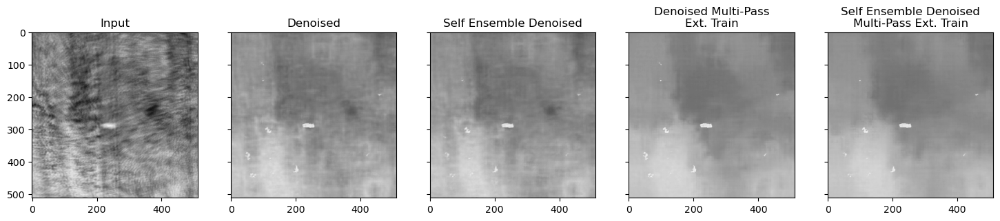

Calculating output(s):   8%|█████                                                       | 1/12 [00:08<01:35,  8.64s/it]

real_integrals\1_14m_29s.png


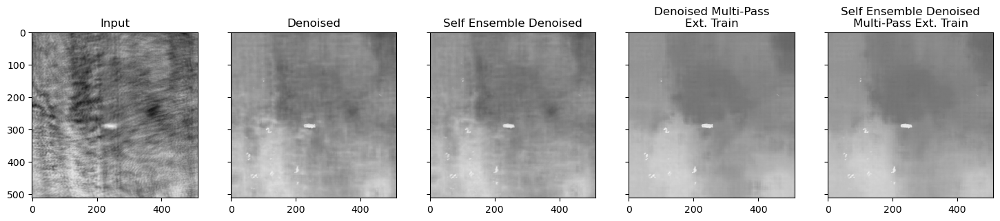

Calculating output(s):  17%|██████████                                                  | 2/12 [00:15<01:14,  7.47s/it]

real_integrals\1_5m_11s.png


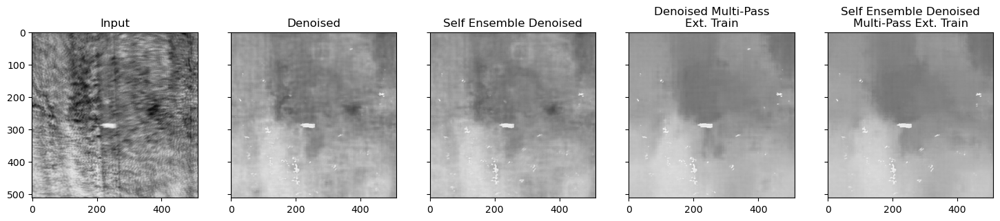

Calculating output(s):  25%|███████████████                                             | 3/12 [00:21<01:03,  7.06s/it]

real_integrals\2_10m_21s.png


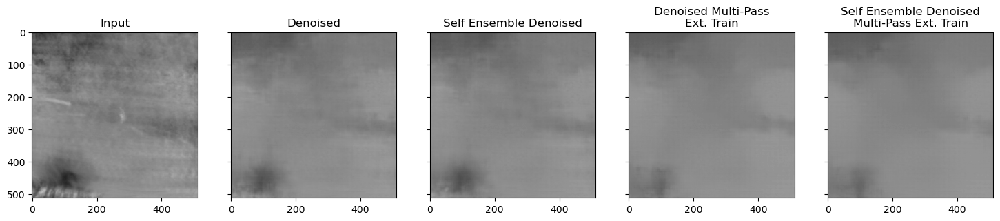

Calculating output(s):  33%|████████████████████                                        | 4/12 [00:28<00:54,  6.84s/it]

real_integrals\2_14m_29s.png


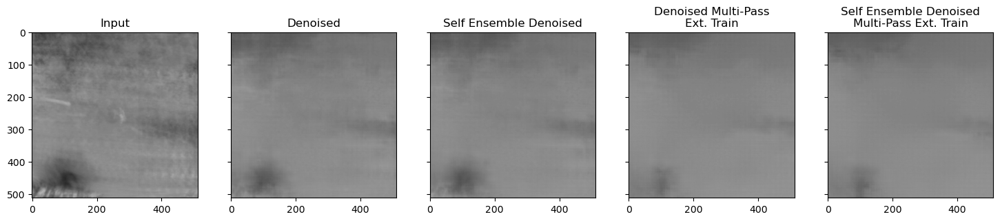

Calculating output(s):  42%|█████████████████████████                                   | 5/12 [00:34<00:47,  6.72s/it]

real_integrals\2_5m_11s.png


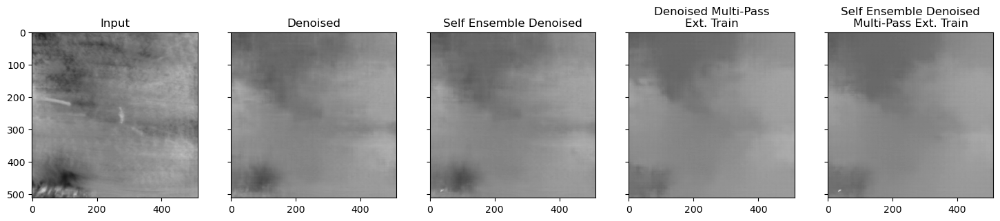

Calculating output(s):  50%|██████████████████████████████                              | 6/12 [00:41<00:39,  6.66s/it]

real_integrals\3_10m_21s.png


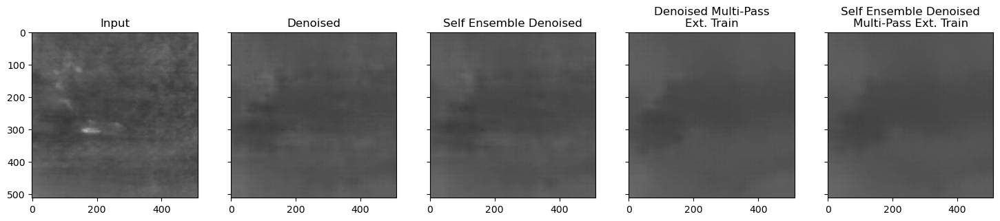

Calculating output(s):  58%|███████████████████████████████████                         | 7/12 [00:48<00:33,  6.65s/it]

real_integrals\3_14m_29s.png


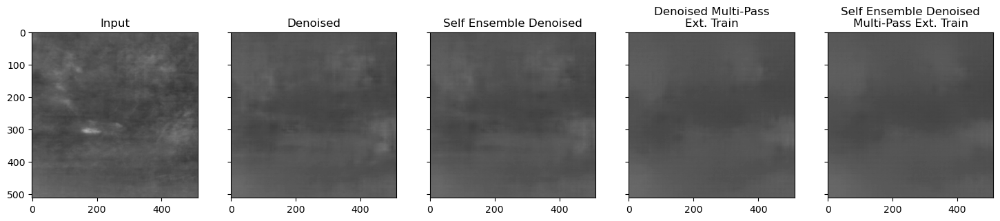

Calculating output(s):  67%|████████████████████████████████████████                    | 8/12 [00:54<00:26,  6.64s/it]

real_integrals\3_5m_11s.png


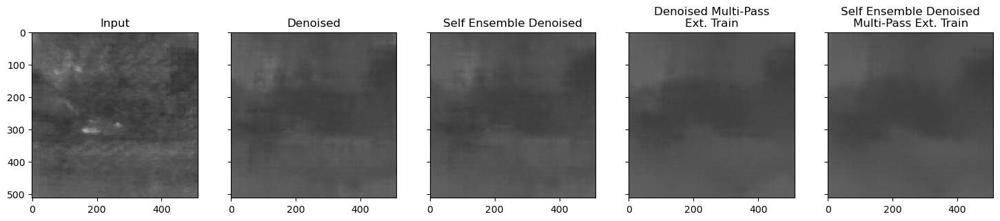

Calculating output(s):  75%|█████████████████████████████████████████████               | 9/12 [01:01<00:19,  6.63s/it]

real_integrals\4_10m_21s.png


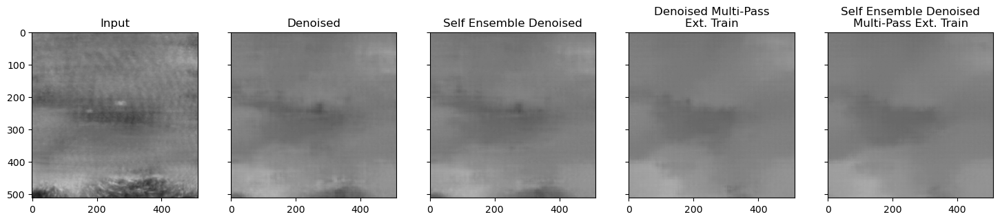

Calculating output(s):  83%|█████████████████████████████████████████████████▏         | 10/12 [01:07<00:13,  6.64s/it]

real_integrals\4_14m_29s.png


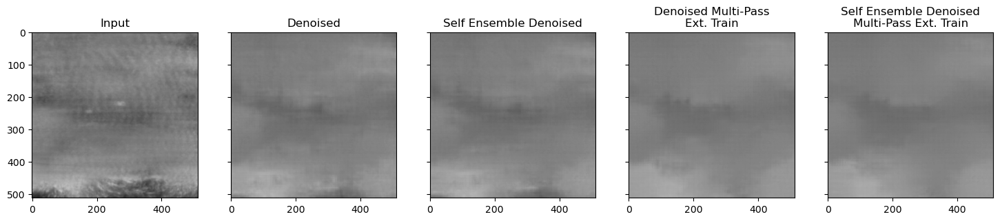

Calculating output(s):  92%|██████████████████████████████████████████████████████     | 11/12 [01:14<00:06,  6.66s/it]

real_integrals\4_5m_11s.png


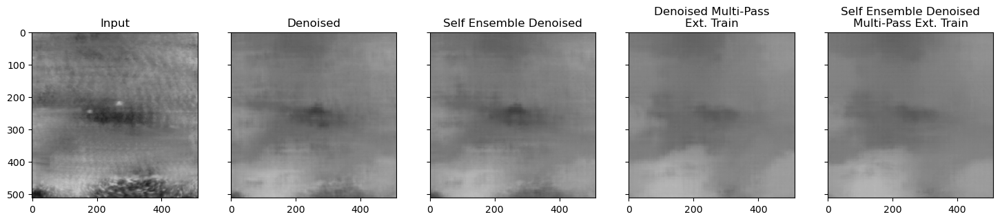

Calculating output(s): 100%|███████████████████████████████████████████████████████████| 12/12 [01:21<00:00,  6.77s/it]


In [4]:
make_predictions(input_image_path='real_integrals')

Detected folder as input path, loading all files


Calculating output(s):   0%|                                                                    | 0/61 [00:00<?, ?it/s]

real_integrals\focal_stack\FP_0.00.png


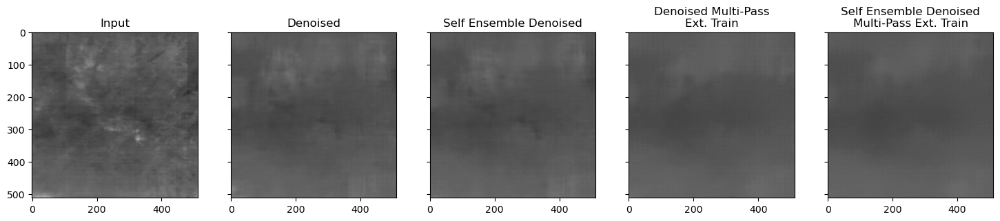

Calculating output(s):   2%|▉                                                           | 1/61 [00:06<06:33,  6.56s/it]

real_integrals\focal_stack\FP_0.05.png


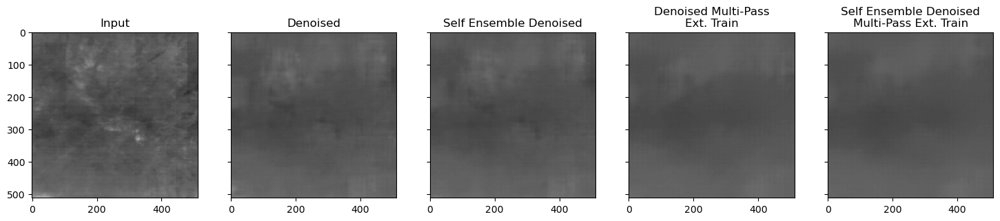

Calculating output(s):   3%|█▉                                                          | 2/61 [00:13<06:26,  6.56s/it]

real_integrals\focal_stack\FP_0.10.png


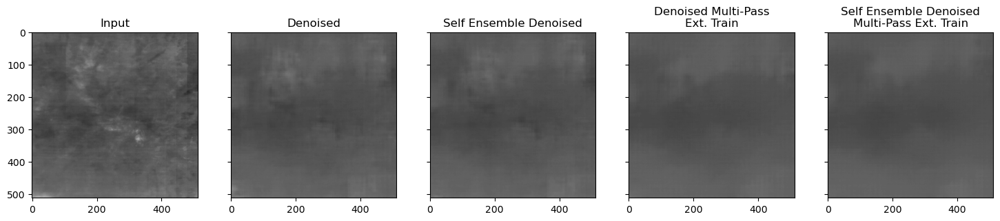

Calculating output(s):   5%|██▉                                                         | 3/61 [00:19<06:20,  6.57s/it]

real_integrals\focal_stack\FP_0.15.png


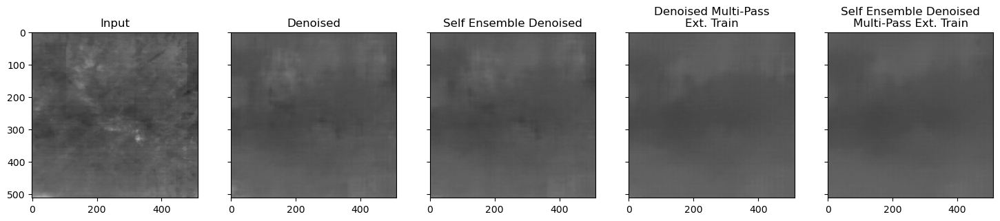

Calculating output(s):   7%|███▉                                                        | 4/61 [00:26<06:14,  6.57s/it]

real_integrals\focal_stack\FP_0.20.png


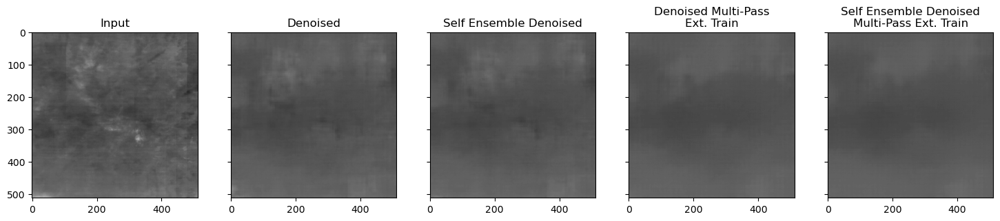

Calculating output(s):   8%|████▉                                                       | 5/61 [00:32<06:07,  6.57s/it]

real_integrals\focal_stack\FP_0.25.png


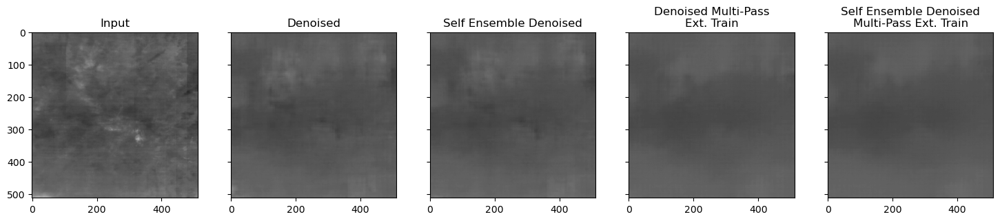

Calculating output(s):  10%|█████▉                                                      | 6/61 [00:39<06:01,  6.57s/it]

real_integrals\focal_stack\FP_0.30.png


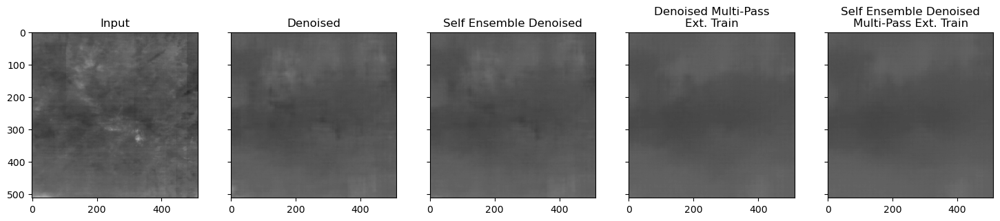

Calculating output(s):  11%|██████▉                                                     | 7/61 [00:45<05:54,  6.57s/it]

real_integrals\focal_stack\FP_0.35.png


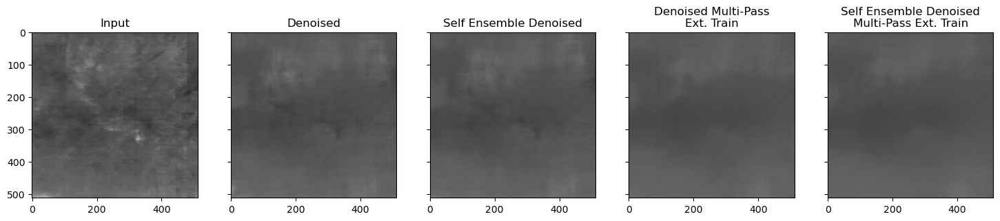

Calculating output(s):  13%|███████▊                                                    | 8/61 [00:52<05:50,  6.61s/it]

real_integrals\focal_stack\FP_0.40.png


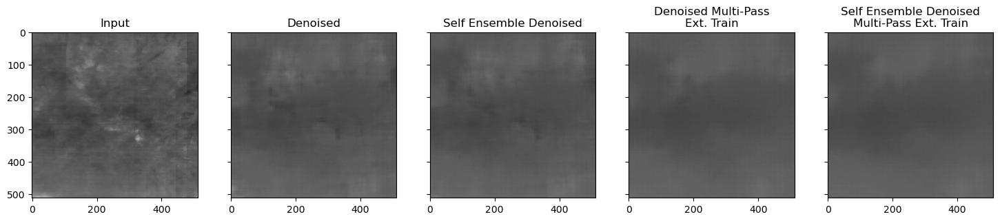

Calculating output(s):  15%|████████▊                                                   | 9/61 [00:59<05:45,  6.65s/it]

real_integrals\focal_stack\FP_0.45.png


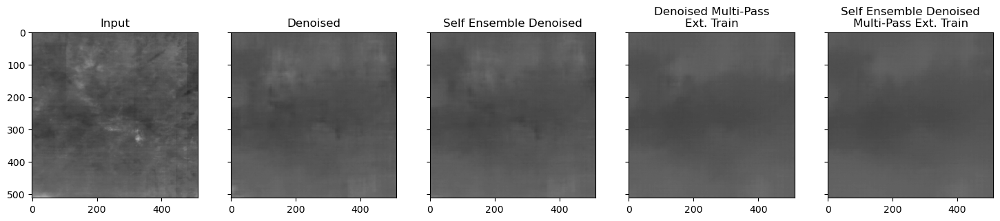

Calculating output(s):  16%|█████████▋                                                 | 10/61 [01:06<05:39,  6.66s/it]

real_integrals\focal_stack\FP_0.50.png


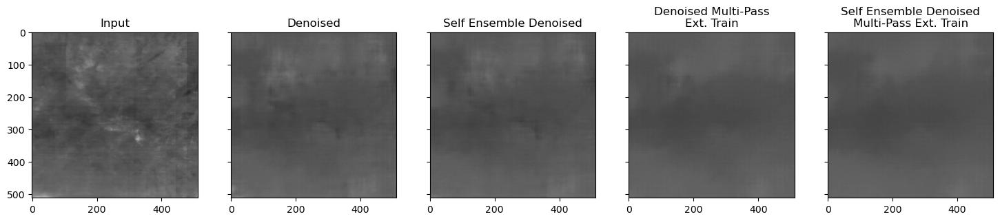

Calculating output(s):  18%|██████████▋                                                | 11/61 [01:12<05:34,  6.69s/it]

real_integrals\focal_stack\FP_0.55.png


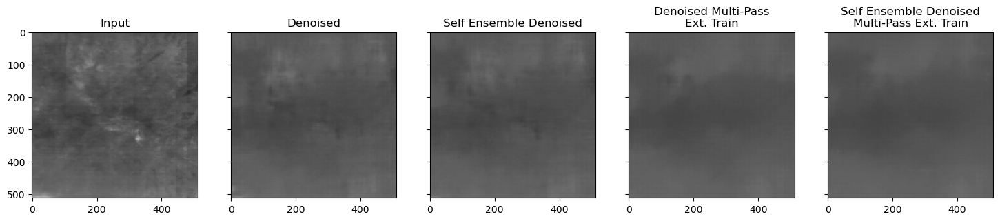

Calculating output(s):  20%|███████████▌                                               | 12/61 [01:19<05:28,  6.70s/it]

real_integrals\focal_stack\FP_0.60.png


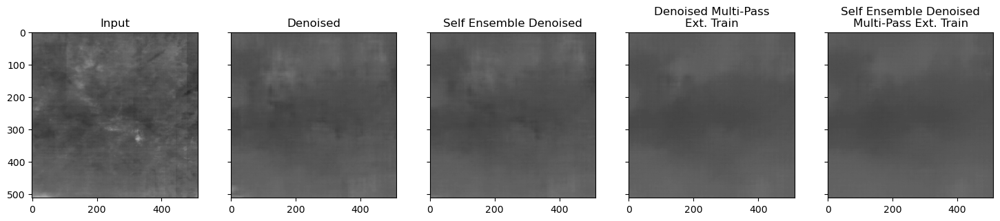

Calculating output(s):  21%|████████████▌                                              | 13/61 [01:26<05:28,  6.85s/it]

real_integrals\focal_stack\FP_0.65.png


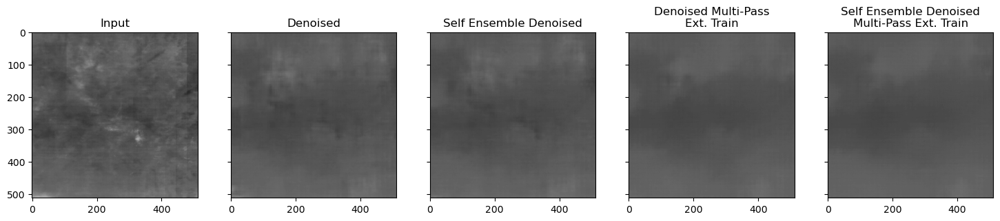

Calculating output(s):  23%|█████████████▌                                             | 14/61 [01:34<05:27,  6.97s/it]

real_integrals\focal_stack\FP_0.70.png


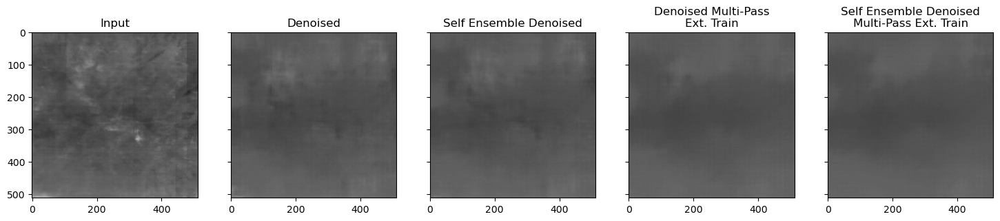

Calculating output(s):  25%|██████████████▌                                            | 15/61 [01:41<05:24,  7.06s/it]

real_integrals\focal_stack\FP_0.75.png


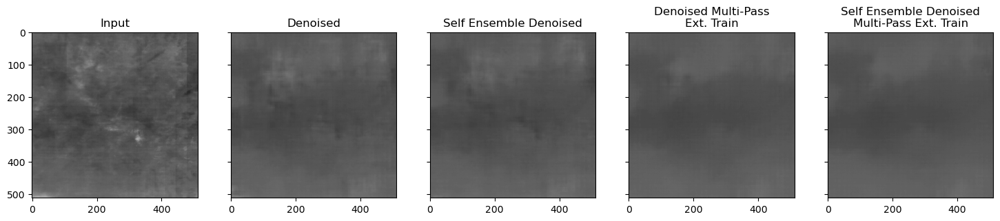

Calculating output(s):  26%|███████████████▍                                           | 16/61 [01:48<05:20,  7.12s/it]

real_integrals\focal_stack\FP_0.80.png


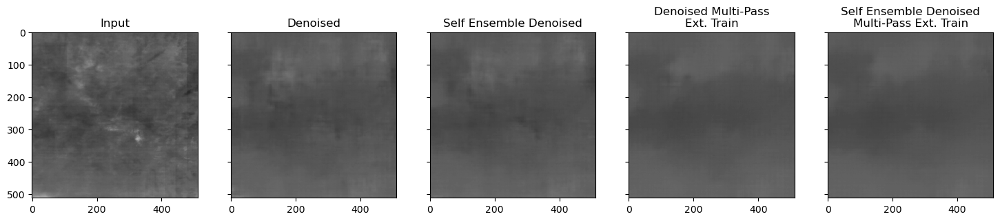

Calculating output(s):  28%|████████████████▍                                          | 17/61 [01:55<05:15,  7.16s/it]

real_integrals\focal_stack\FP_0.85.png


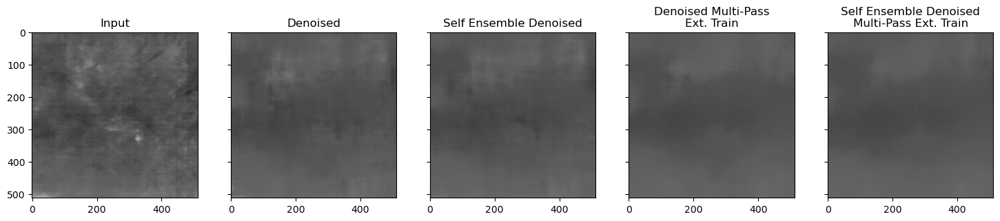

Calculating output(s):  30%|█████████████████▍                                         | 18/61 [02:03<05:09,  7.19s/it]

real_integrals\focal_stack\FP_0.90.png


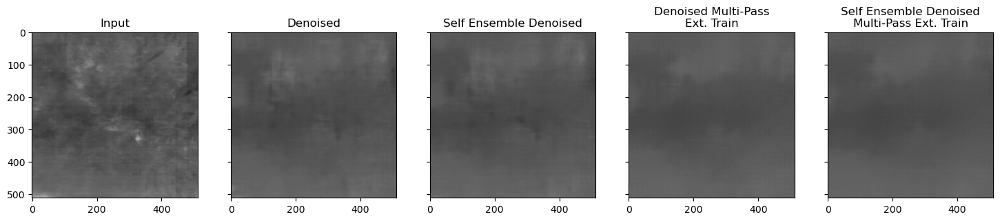

Calculating output(s):  31%|██████████████████▍                                        | 19/61 [02:10<05:03,  7.22s/it]

real_integrals\focal_stack\FP_0.95.png


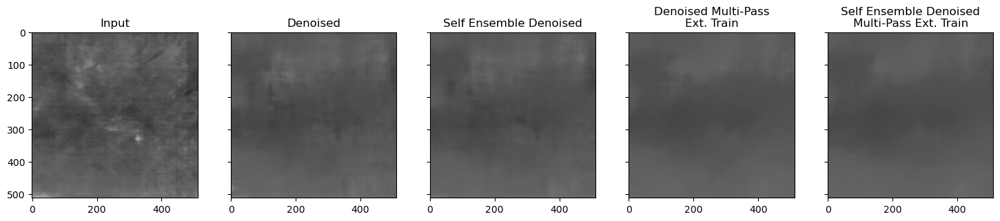

Calculating output(s):  33%|███████████████████▎                                       | 20/61 [02:17<04:56,  7.24s/it]

real_integrals\focal_stack\FP_1.00.png


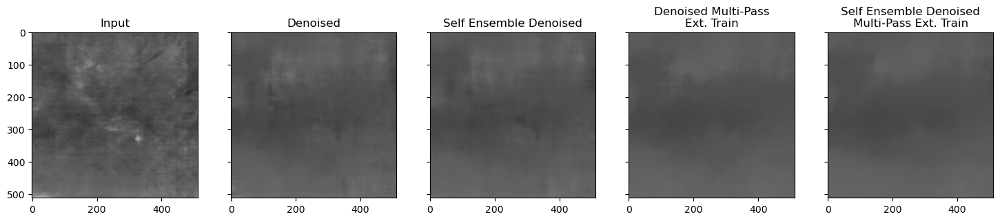

Calculating output(s):  34%|████████████████████▎                                      | 21/61 [02:24<04:49,  7.25s/it]

real_integrals\focal_stack\FP_1.05.png


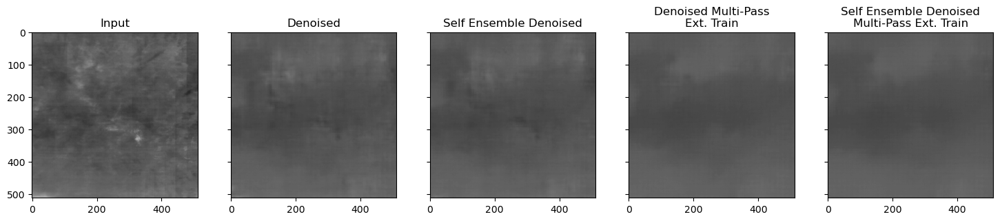

Calculating output(s):  36%|█████████████████████▎                                     | 22/61 [02:32<04:42,  7.25s/it]

real_integrals\focal_stack\FP_1.10.png


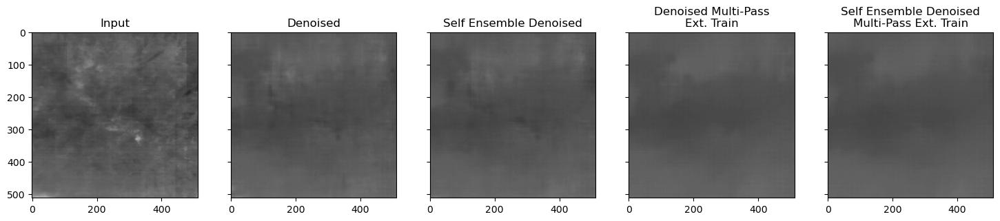

Calculating output(s):  38%|██████████████████████▏                                    | 23/61 [02:39<04:36,  7.27s/it]

real_integrals\focal_stack\FP_1.15.png


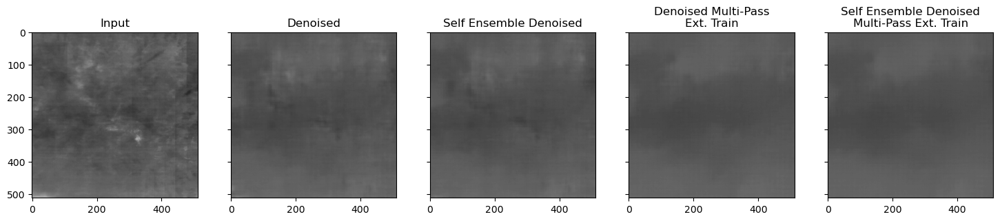

Calculating output(s):  39%|███████████████████████▏                                   | 24/61 [02:46<04:28,  7.27s/it]

real_integrals\focal_stack\FP_1.20.png


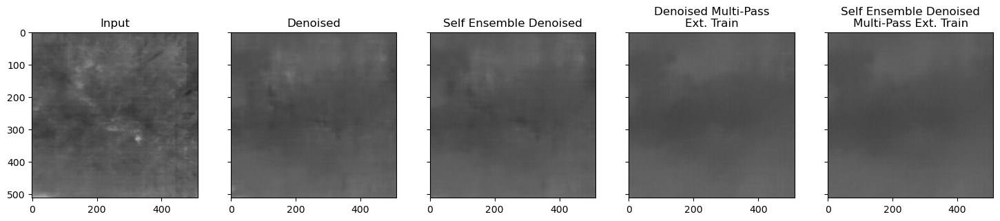

Calculating output(s):  41%|████████████████████████▏                                  | 25/61 [02:54<04:22,  7.28s/it]

real_integrals\focal_stack\FP_1.25.png


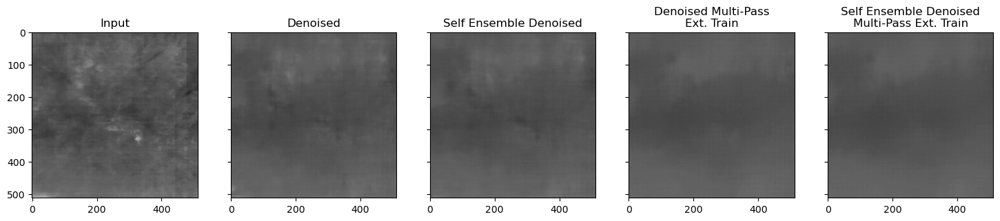

Calculating output(s):  43%|█████████████████████████▏                                 | 26/61 [03:01<04:15,  7.29s/it]

real_integrals\focal_stack\FP_1.30.png


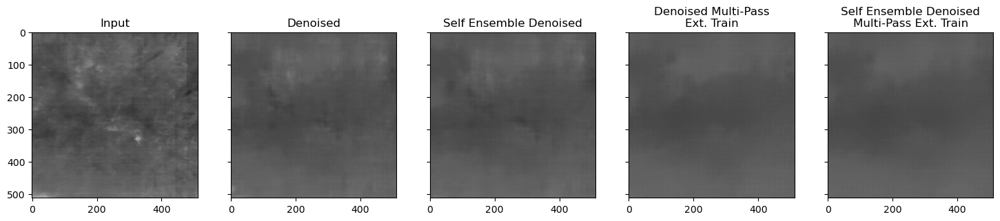

Calculating output(s):  44%|██████████████████████████                                 | 27/61 [03:08<04:08,  7.30s/it]

real_integrals\focal_stack\FP_1.35.png


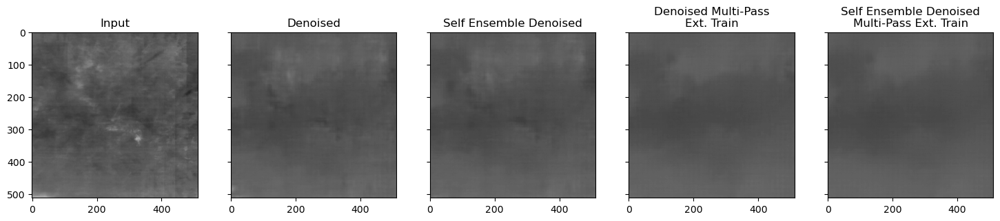

Calculating output(s):  46%|███████████████████████████                                | 28/61 [03:16<04:01,  7.32s/it]

real_integrals\focal_stack\FP_1.40.png


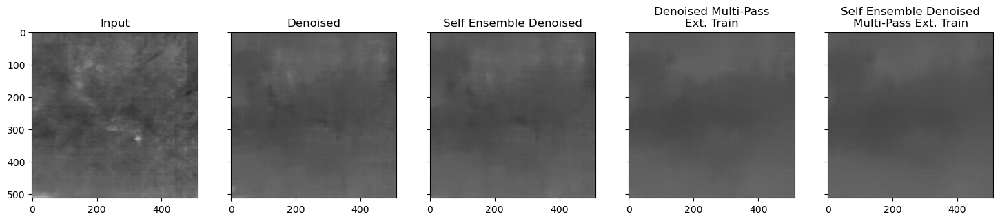

Calculating output(s):  48%|████████████████████████████                               | 29/61 [03:23<03:54,  7.33s/it]

real_integrals\focal_stack\FP_1.45.png


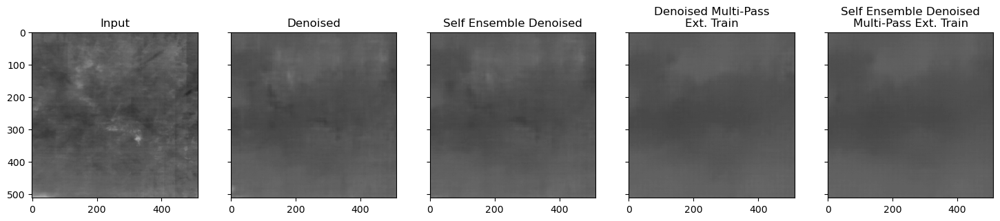

Calculating output(s):  49%|█████████████████████████████                              | 30/61 [03:30<03:46,  7.32s/it]

real_integrals\focal_stack\FP_1.50.png


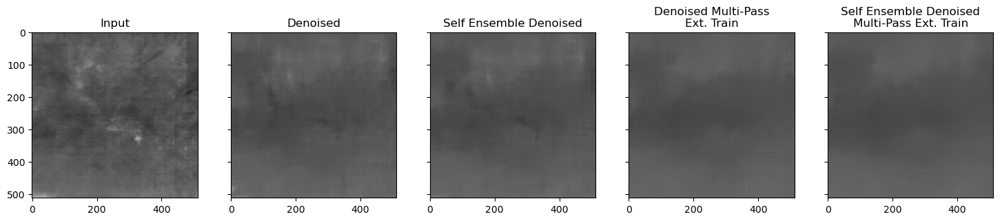

Calculating output(s):  51%|█████████████████████████████▉                             | 31/61 [03:38<03:39,  7.32s/it]

real_integrals\focal_stack\FP_1.55.png


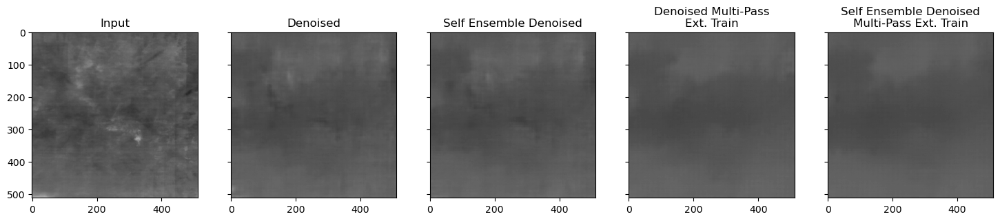

Calculating output(s):  52%|██████████████████████████████▉                            | 32/61 [03:45<03:32,  7.32s/it]

real_integrals\focal_stack\FP_1.60.png


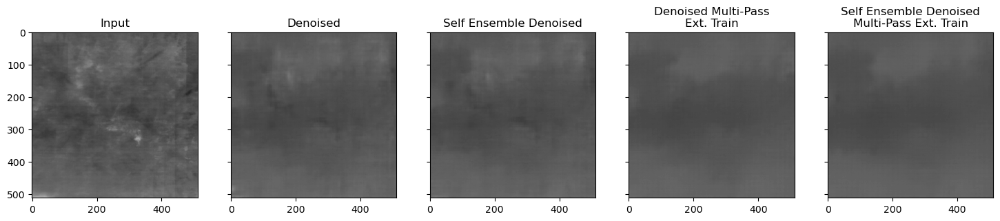

Calculating output(s):  54%|███████████████████████████████▉                           | 33/61 [03:52<03:24,  7.32s/it]

real_integrals\focal_stack\FP_1.65.png


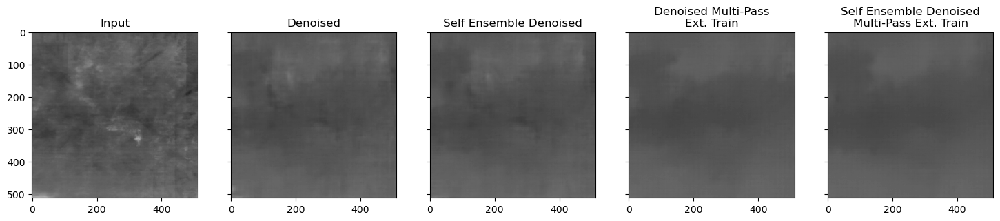

Calculating output(s):  56%|████████████████████████████████▉                          | 34/61 [04:00<03:17,  7.33s/it]

real_integrals\focal_stack\FP_1.70.png


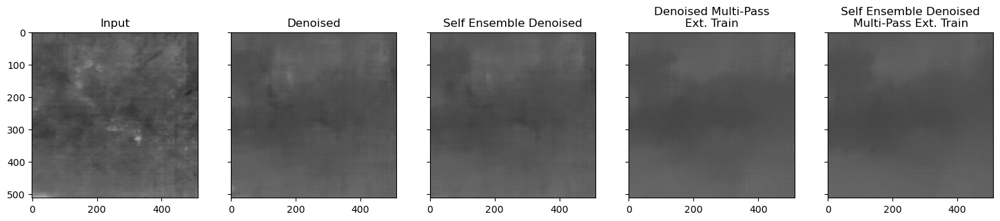

Calculating output(s):  57%|█████████████████████████████████▊                         | 35/61 [04:07<03:10,  7.34s/it]

real_integrals\focal_stack\FP_1.75.png


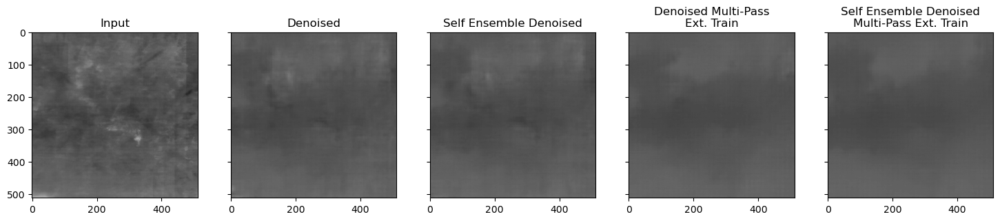

Calculating output(s):  59%|██████████████████████████████████▊                        | 36/61 [04:14<03:00,  7.23s/it]

real_integrals\focal_stack\FP_1.80.png


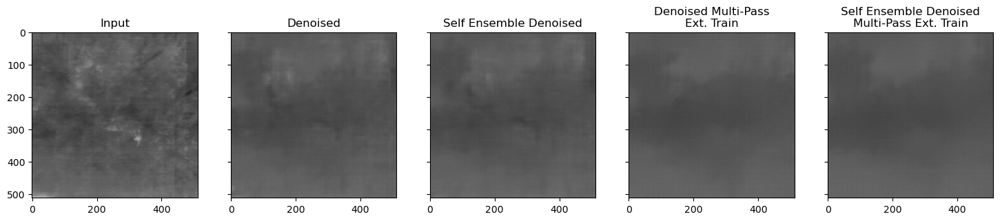

Calculating output(s):  61%|███████████████████████████████████▊                       | 37/61 [04:21<02:49,  7.07s/it]

real_integrals\focal_stack\FP_1.85.png


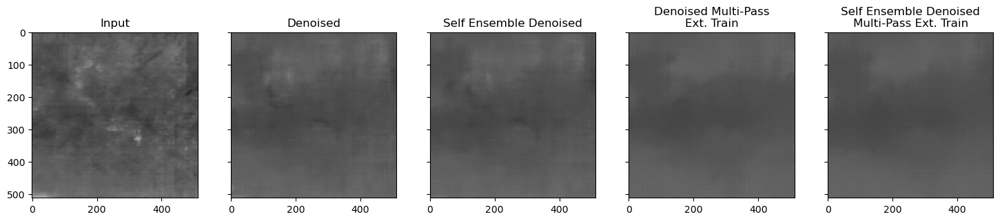

Calculating output(s):  62%|████████████████████████████████████▊                      | 38/61 [04:27<02:39,  6.95s/it]

real_integrals\focal_stack\FP_1.90.png


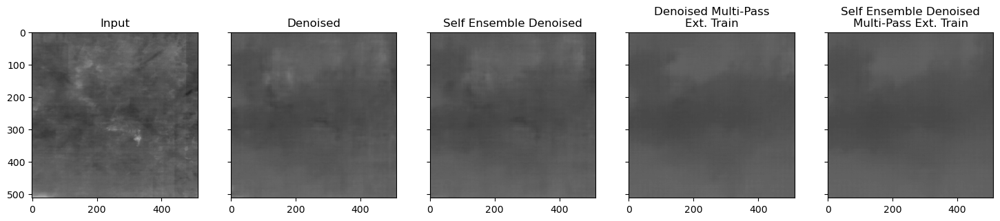

Calculating output(s):  64%|█████████████████████████████████████▋                     | 39/61 [04:34<02:31,  6.87s/it]

real_integrals\focal_stack\FP_1.95.png


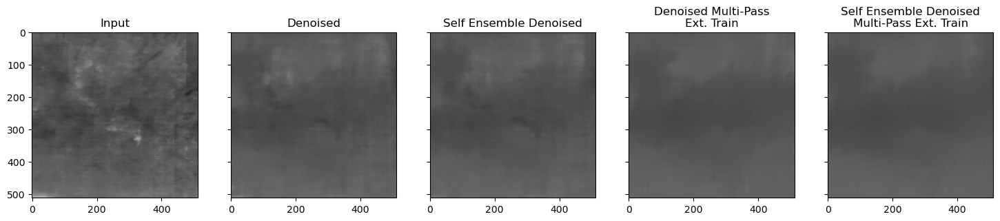

Calculating output(s):  66%|██████████████████████████████████████▋                    | 40/61 [04:41<02:22,  6.81s/it]

real_integrals\focal_stack\FP_2.00.png


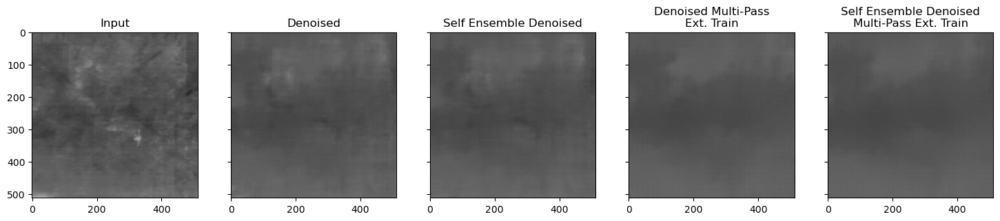

Calculating output(s):  67%|███████████████████████████████████████▋                   | 41/61 [04:48<02:17,  6.89s/it]

real_integrals\focal_stack\FP_2.05.png


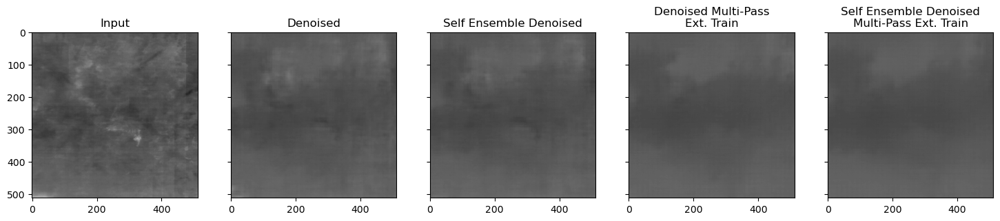

Calculating output(s):  69%|████████████████████████████████████████▌                  | 42/61 [04:55<02:13,  7.02s/it]

real_integrals\focal_stack\FP_2.10.png


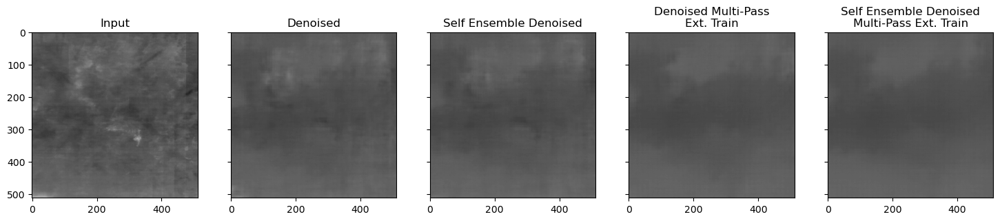

Calculating output(s):  70%|█████████████████████████████████████████▌                 | 43/61 [05:02<02:07,  7.10s/it]

real_integrals\focal_stack\FP_2.15.png


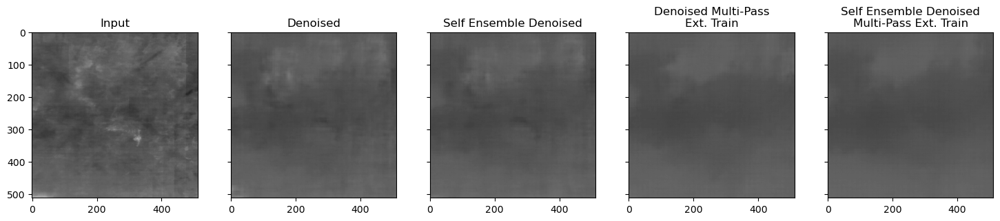

Calculating output(s):  72%|██████████████████████████████████████████▌                | 44/61 [05:09<01:59,  7.04s/it]

real_integrals\focal_stack\FP_2.20.png


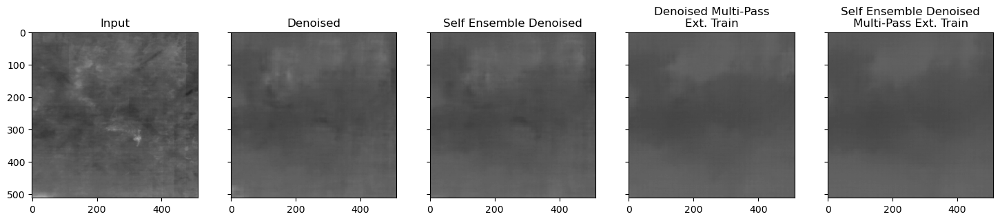

Calculating output(s):  74%|███████████████████████████████████████████▌               | 45/61 [05:16<01:51,  7.00s/it]

real_integrals\focal_stack\FP_2.25.png


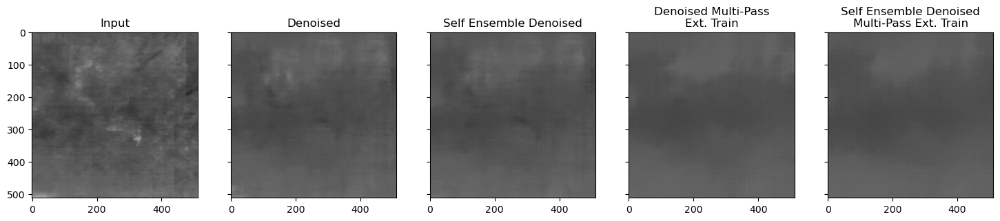

Calculating output(s):  75%|████████████████████████████████████████████▍              | 46/61 [05:23<01:45,  7.00s/it]

real_integrals\focal_stack\FP_2.30.png


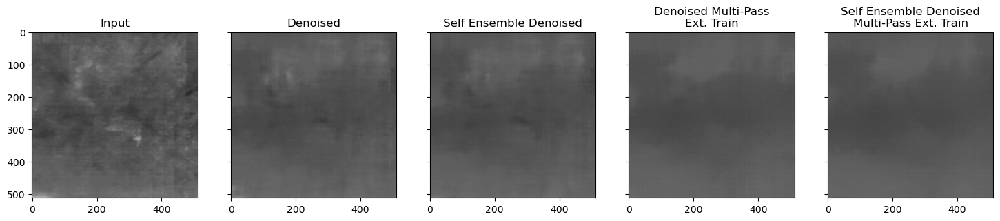

Calculating output(s):  77%|█████████████████████████████████████████████▍             | 47/61 [05:30<01:38,  7.02s/it]

real_integrals\focal_stack\FP_2.35.png


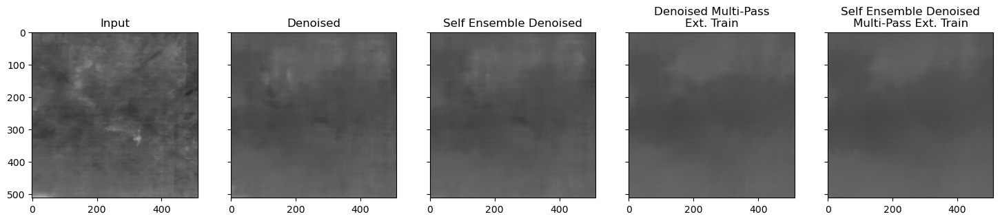

Calculating output(s):  79%|██████████████████████████████████████████████▍            | 48/61 [05:37<01:30,  6.97s/it]

real_integrals\focal_stack\FP_2.40.png


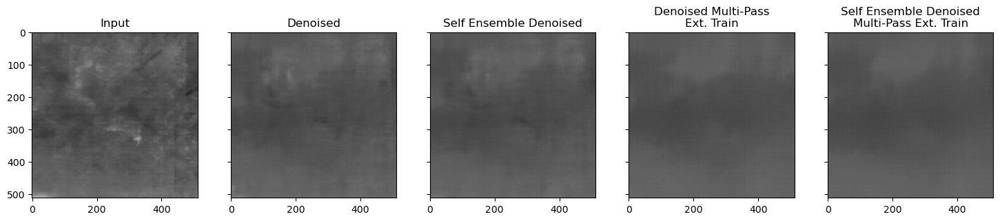

Calculating output(s):  80%|███████████████████████████████████████████████▍           | 49/61 [05:44<01:22,  6.89s/it]

real_integrals\focal_stack\FP_2.45.png


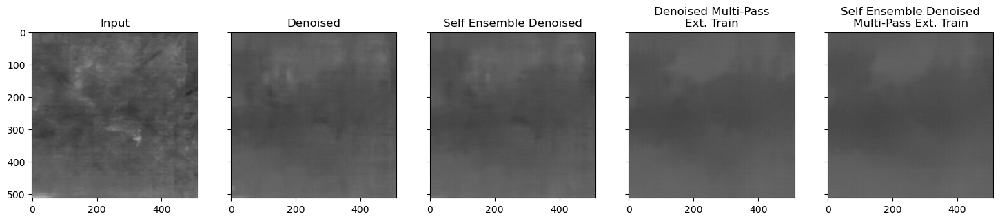

Calculating output(s):  82%|████████████████████████████████████████████████▎          | 50/61 [05:50<01:15,  6.82s/it]

real_integrals\focal_stack\FP_2.50.png


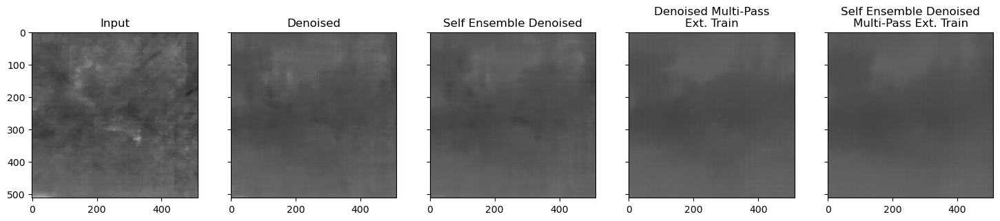

Calculating output(s):  84%|█████████████████████████████████████████████████▎         | 51/61 [05:57<01:07,  6.80s/it]

real_integrals\focal_stack\FP_2.55.png


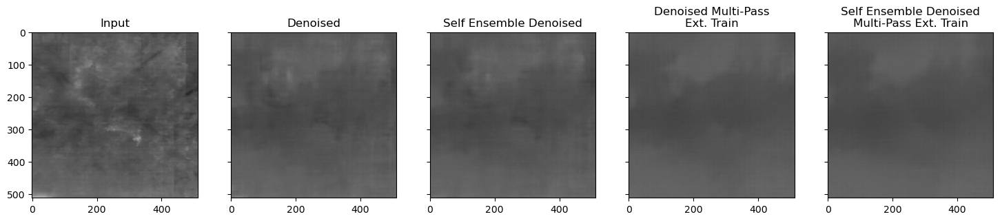

Calculating output(s):  85%|██████████████████████████████████████████████████▎        | 52/61 [06:04<01:01,  6.82s/it]

real_integrals\focal_stack\FP_2.60.png


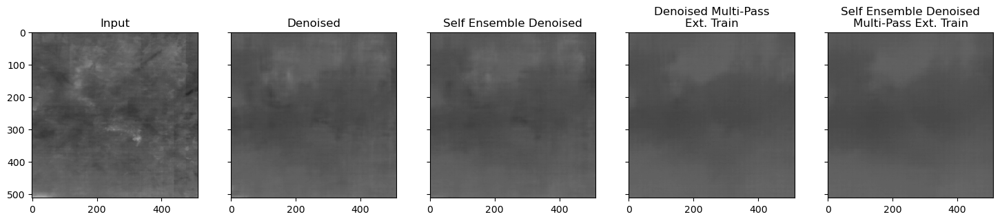

Calculating output(s):  87%|███████████████████████████████████████████████████▎       | 53/61 [06:11<00:54,  6.82s/it]

real_integrals\focal_stack\FP_2.65.png


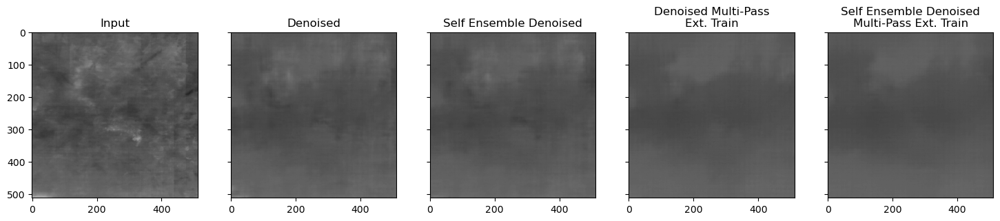

Calculating output(s):  89%|████████████████████████████████████████████████████▏      | 54/61 [06:18<00:47,  6.80s/it]

real_integrals\focal_stack\FP_2.70.png


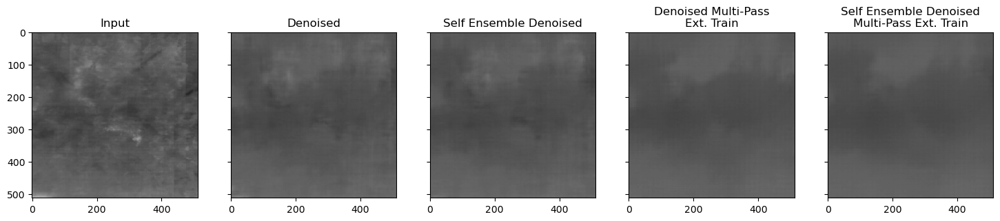

Calculating output(s):  90%|█████████████████████████████████████████████████████▏     | 55/61 [06:24<00:40,  6.78s/it]

real_integrals\focal_stack\FP_2.75.png


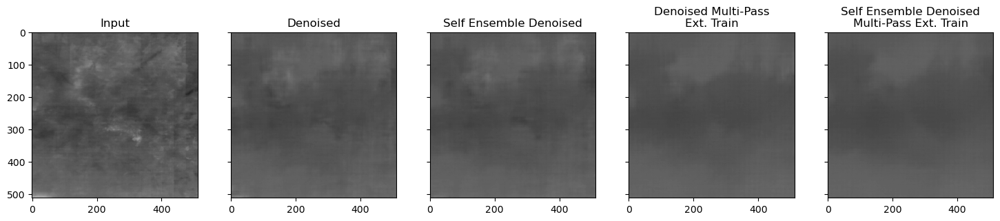

Calculating output(s):  92%|██████████████████████████████████████████████████████▏    | 56/61 [06:31<00:34,  6.89s/it]

real_integrals\focal_stack\FP_2.80.png


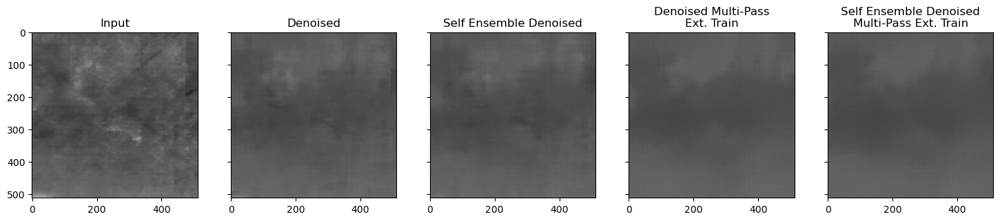

Calculating output(s):  93%|███████████████████████████████████████████████████████▏   | 57/61 [06:39<00:27,  6.96s/it]

real_integrals\focal_stack\FP_2.85.png


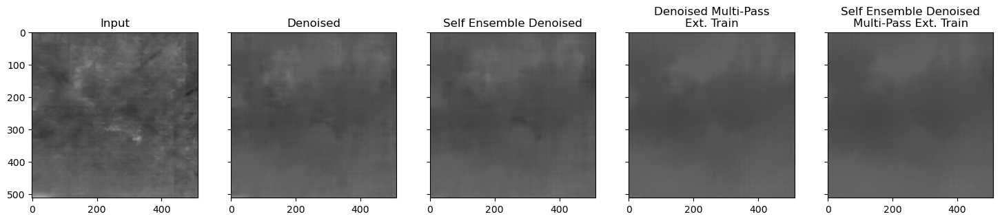

Calculating output(s):  95%|████████████████████████████████████████████████████████   | 58/61 [06:46<00:21,  7.21s/it]

real_integrals\focal_stack\FP_2.90.png


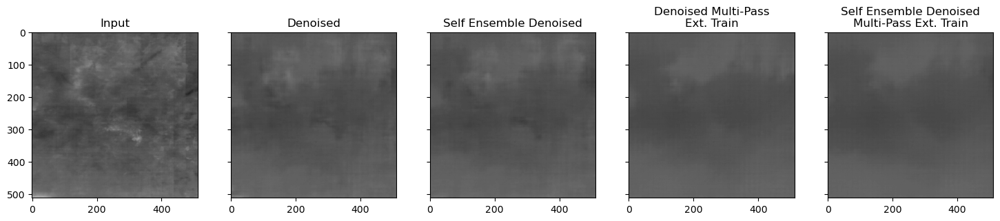

Calculating output(s):  97%|█████████████████████████████████████████████████████████  | 59/61 [06:53<00:14,  7.12s/it]

real_integrals\focal_stack\FP_2.95.png


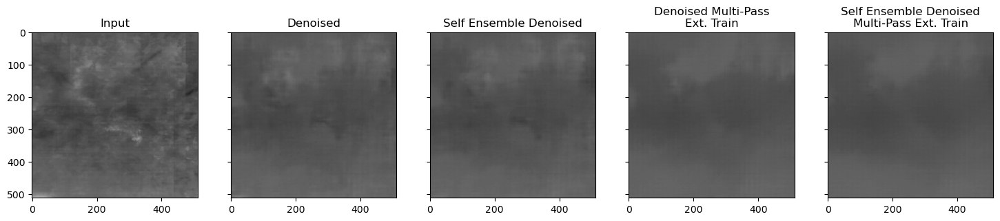

Calculating output(s):  98%|██████████████████████████████████████████████████████████ | 60/61 [07:00<00:07,  7.04s/it]

real_integrals\focal_stack\FP_3.00.png


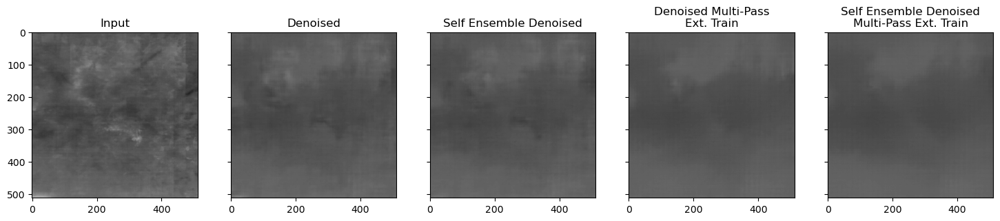

Calculating output(s): 100%|███████████████████████████████████████████████████████████| 61/61 [07:07<00:00,  7.01s/it]


In [5]:
make_predictions(input_image_path=os.path.join('real_integrals', 'focal_stack'))